# Bangsamoro Earthquake Data Visualization
## Links
1. https://towardsdatascience.com/how-to-create-an-interactive-geographic-map-using-python-and-bokeh-12981ca0b567

## Instructions(Local)
0. Make sure packages required are installed : `pip install -r requirements.txt`
1. Running this notebook is not needed. We can go directly to command line and run `bokeh serve path/to/this/ipynb --show`
2. Open localhost:5006/earthquake on your browser or whatever link is provided after step 1
3. Wait for a while as bokeh is quite slow(possibly depend on your machine)

## Todo
1. Include non BARMM Geodata as the visualization has a lot of white space, but gray out this non BARMM as this is not part of the project
2. Fix hover, it is not working when changing to medium risk earthquake data
3. Deploy to heroku
4. See if PWA/Offline App possible

In [1]:
import pandas as pd
import numpy as np
import math

import geopandas as gpd
import shapely.geometry as gm
import json

# Data Processing

## Risk Data

In [2]:
highrisk = pd.read_csv('data/high_risk0.csv')
medrisk = pd.read_csv('data/midrisk.csv')
medrisk_sea = pd.read_csv('data/medium.csv')

In [3]:
highrisk = gpd.GeoDataFrame(highrisk.drop(['latitude','longitude'],axis=1), crs={'init': 'epsg:4326'} ,geometry = [gm.Point(latlong) for latlong in zip(highrisk.longitude, highrisk.latitude)])
medrisk = gpd.GeoDataFrame(medrisk.drop(['latitude','longitude'],axis=1), crs={'init': 'epsg:4326'} ,geometry = [gm.Point(latlong) for latlong in zip(medrisk.longitude, medrisk.latitude)])
medrisk_sea = gpd.GeoDataFrame(medrisk_sea.drop(['latitude','longitude'],axis=1), crs={'init': 'epsg:4326'} ,geometry = [gm.Point(latlong) for latlong in zip(medrisk_sea.longitude, medrisk_sea.latitude)])

## Geo Data

In [4]:
bm = gpd.read_file('brgy_data/AdministrativeBoundariesBARMMBarangays20190206PSA2016.shp')

In [5]:
bm = bm.to_crs(epsg=4236)

In [6]:
bm['geometry'] = [geometry for geometry in bm['geometry'].simplify(0.001).translate(xoff=0.0075,yoff=-0.0019) ]

## Population Data

In [9]:
population = pd.read_csv('brgy_data/2015pop.csv')

## Combine

In [10]:
lenbm = len(bm)
lenhr = len(highrisk)
lenmdr = len(medrisk)#combine all medrisk  /
lenmdr2 = len(medrisk_sea)
bm_range = range(lenbm)
highrisk_range = range(lenhr)
medrisk_range = range(lenmdr)
medrisksea_range = range(lenmdr2)

In [11]:
bangsamoro_risk = {'high':[],'med':[], 'med_sea':[]}
#max_geo_distance = 180 #assuming that max distance of geoobjects is 180'.''
for x in bm_range:
    brgy_highrisk = 0
    brgy_medrisk = 0
    brgy_medrisksea = 0
    for y in highrisk_range:
        brgy_highrisk += bm.geometry[x].centroid.distance(highrisk.geometry[y])
    for z in medrisk_range:
        brgy_medrisk += bm.geometry[x].centroid.distance(medrisk.geometry[z])
    for v in medrisksea_range:
        brgy_medrisksea += bm.geometry[x].centroid.distance(medrisk_sea.geometry[v])
    bangsamoro_risk['high'].append(1/(brgy_highrisk)**2)
    bangsamoro_risk['med'].append(1/(brgy_medrisk)**2)
    bangsamoro_risk['med_sea'].append(1/(brgy_medrisksea)**2)

In [12]:
#add normalized to geodata for choropleth
bm['high'] = bangsamoro_risk['high']
bm['high'] = bm['high']/bm['high'].max()
bm['med'] = bangsamoro_risk['med']
bm['med'] = bm['med']/bm['med'].max()
bm['med_sea'] = bangsamoro_risk['med_sea']
bm['med_sea'] = bm['med_sea']/bm['med_sea'].max()

In [13]:
bm = bm.merge(population[['Pop2015','PSGC_BRGY']], left_on='Bgy_Code', right_on='PSGC_BRGY').drop('PSGC_BRGY', axis=1)

In [14]:
bm.head()

,Reg_Code,Reg_Name,Pro_Code,Pro_Name,Mun_Code,Mun_Name,Bgy_Code,Bgy_Name,geometry,high,med,med_sea,Pop2015
0,PH150000000,AUTONOMOUS REGION IN MUSLIM MINDANAO (ARMM),PH157000000,TAWI-TAWI,PH157001000,PANGLIMA SUGALA (BALIMBING),PH157001001,Balimbing Proper,"MULTIPOLYGON (((119.95379 5.07846, 119.95611 5...",0.011272,0.010494,0.210419,4887
1,PH150000000,AUTONOMOUS REGION IN MUSLIM MINDANAO (ARMM),PH157000000,TAWI-TAWI,PH157001000,PANGLIMA SUGALA (BALIMBING),PH157001002,Batu-batu (Pob.),"POLYGON ((119.88714 5.06913, 119.88747 5.07013...",0.010914,0.010169,0.195194,3380
2,PH150000000,AUTONOMOUS REGION IN MUSLIM MINDANAO (ARMM),PH157000000,TAWI-TAWI,PH157001000,PANGLIMA SUGALA (BALIMBING),PH157001003,Buan,"MULTIPOLYGON (((120.06368 5.16126, 120.06395 5...",0.011542,0.010745,0.221000,3795
3,PH150000000,AUTONOMOUS REGION IN MUSLIM MINDANAO (ARMM),PH157000000,TAWI-TAWI,PH157001000,PANGLIMA SUGALA (BALIMBING),PH157001004,Dungon,"POLYGON ((120.13590 5.19596, 120.13563 5.19764...",0.012238,0.011383,0.252355,1850
4,PH150000000,AUTONOMOUS REGION IN MUSLIM MINDANAO (ARMM),PH157000000,TAWI-TAWI,PH157001000,PANGLIMA SUGALA (BALIMBING),PH157001005,Luuk Buntal,"MULTIPOLYGON (((119.98781 4.98559, 119.98756 4...",0.011215,0.010430,0.210000,2056


## Output

In [16]:
medrisk_sea.to_file("output2/medsea.geojson", driver = "GeoJSON")
medrisk.to_file("output2/medrisk.geojson", driver = "GeoJSON")
highrisk.to_file("output2/highrisk.geojson", driver = "GeoJSON")
bm.to_file("output2/merged_data.geojson", driver = "GeoJSON")

# Visualizations

## Builtin/Matplotlib

In [15]:
x = bm.plot(color='lightblue', edgecolor='gray', figsize=(30,30))
#y = bm.plot(color='lightblue', edgecolor='gray', figsize=(30,30))
#z = bm.plot(color='lightblue', edgecolor='gray', figsize=(30,30))

In [16]:
highrisk.plot(ax=x, color='red')

<Figure size 432x288 with 0 Axes>

In [17]:
medrisk.plot(ax=x, color='orange')
medrisk_sea.plot(ax=x, color='green')

<Figure size 432x288 with 0 Axes>

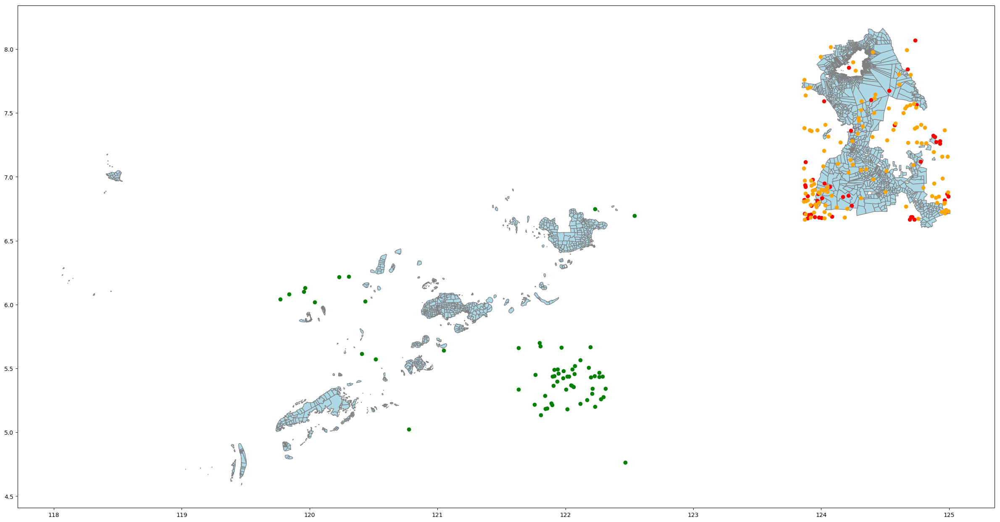

In [20]:
x.get_figure()

## Bokeh

In [ ]:
from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, NumeralTickFormatter
from bokeh.palettes import brewer

from bokeh.io.doc import curdoc
from bokeh.models import Slider, HoverTool, Select
from bokeh.layouts import widgetbox, row, column

In [ ]:
def update_plot(attr,old,new):
    severity=select.value
    new_data = json_data(severity)
    #input_field
    geosource.geojson = new_data
    hover = HoverTool(tooltips = [('Municipality','@Mun_Name'),(severity+' risk','@'+severity)])
    p = make_plot(severity)
    layout=column(p,widgetbox(select))
    curdoc().clear()
    curdoc().add_root(layout)

In [ ]:
def json_data(severity):
    if severity == 'high':
        return json.dumps(json.loads(bm.drop(['med', 'med_sea'], axis=1).to_json()))
    if severity == 'med':
        return json.dumps(json.loads(bm.drop(['high', 'med_sea'], axis=1).to_json()))
    return json.dumps(json.loads(bm.drop(['high', 'med'],axis=1).to_json()))    

In [ ]:
def make_plot(severity):
    color_mapper = LinearColorMapper(palette=palette,low=bm[severity].min(), high=bm[severity].max())
    #format_tick = NumeralTickFormatter(format='0.0')
    color_bar = ColorBar(color_mapper=color_mapper, location=(0,0))
    p = figure(title='Title', plot_height = 650, plot_width = 850, toolbar_location = None)
    #p = figure()
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    p.axis.visible = False
    p.patches('xs', 'ys', source=geosource, fill_color = {'field' : severity, 'transform' : color_mapper}, line_color = 'gray', line_width = 0.25, fill_alpha = 1)
    p.add_layout(color_bar, 'right')
    p.add_tools(hover)
    return p

In [ ]:
severity = 'high'
geosource = GeoJSONDataSource(geojson = json_data(severity))

In [ ]:
palette = brewer['Blues'][8]
palette = palette[::-1]
hover = HoverTool(tooltips = [('Municipality','@Mun_Name'),(severity+' risk','@'+severity),('Population','@POPULATION')])
p = make_plot(severity)
select = Select(title='Select Severity:', value=severity, options=['high','med','med_sea'])
#maybe we could add toggle for epicenters and evacuation centers
select.on_change('value', update_plot)
layout=column(p, widgetbox(select))
curdoc().add_root(layout)

In [ ]:
#output_notebook() #comment out when deploying to heroku

In [ ]:
#p= figure() #comment out when deploying to heroku

In [ ]:
#show(p) #comment out when deploying to heroku

## Plotly

In [18]:
import json
import geopandas as gpd
import plotly.express as px
import plotly.graph_objects as go

In [19]:
bm = gpd.read_file('output2/merged_data.geojson')
with open("output2/merged_data.geojson") as geofile:
    j_file = json.load(geofile)
with open('output2/highrisk.geojson') as highriskfile:
    h_file = json.load(highriskfile)

In [20]:
for feature in j_file["features"]:
    feature['id']= feature['properties']['Bgy_Code']

In [21]:
risk='med_sea'
color = {'high':'spectral_r', 'med':'oranges', 'med_sea':'algae'}
risk_translation = {'high':'Above Magnitude 5 Risk', 'med': 'Below Magnitude 5 Risk', 'med_sea': 'Below Sea-Floor Below Magnitude 5 Risk'}

In [22]:
px.set_mapbox_access_token('pk.eyJ1Ijoia2V2c2VzdHJlbGxhIiwiYSI6ImNrNWlwcWpvZDBoNGEza21zeDc0OWczeDIifQ.-ajWL8TrUDMCN1OzzXTjhg')

In [23]:
fig = px.choropleth_mapbox(bm[['Bgy_Name','Bgy_Code','Pop2015','high','med', 'med_sea']], geojson=j_file, locations='Bgy_Code',
                           color=risk, color_continuous_scale='spectral_r', range_color=(1,0),
                           mapbox_style="light", zoom=6, center = {"lat": 6.509640, "lon": 121.648446},
                           opacity=0.5,labels={'Bgy_Name':'Barangay',risk:'risk', 'Pop2015':'Population'}, hover_data = ['Bgy_Name', 'Pop2015'])
fig.add_trace(go.Scattergeo(geojson=h_file))
#fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

 ['aggrnyl', 'agsunset', 'algae', 'amp', 'armyrose', 'balance',
             'blackbody', 'bluered', 'blues', 'blugrn', 'bluyl', 'brbg',
             'brwnyl', 'bugn', 'bupu', 'burg', 'burgyl', 'cividis', 'curl',
             'darkmint', 'deep', 'delta', 'dense', 'earth', 'edge', 'electric',
             'emrld', 'fall', 'geyser', 'gnbu', 'gray', 'greens', 'greys',
             'haline', 'hot', 'hsv', 'ice', 'icefire', 'inferno', 'jet',
             'magenta', 'magma', 'matter', 'mint', 'mrybm', 'mygbm', 'oranges',
             'orrd', 'oryel', 'peach', 'phase', 'picnic', 'pinkyl', 'piyg',
             'plasma', 'plotly3', 'portland', 'prgn', 'pubu', 'pubugn', 'puor',
             'purd', 'purp', 'purples', 'purpor', 'rainbow', 'rdbu', 'rdgy',
             'rdpu', 'rdylbu', 'rdylgn', 'redor', 'reds', 'solar', 'spectral',
             'speed', 'sunset', 'sunsetdark', 'teal', 'tealgrn', 'tealrose',
             'tempo', 'temps', 'thermal', 'tropic', 'turbid', 'twilight',
             'viridis', 'ylgn', 'ylgnbu', 'ylorbr', 'ylorrd'].

In [33]:
highrisk['geometry']

0     POINT (124.99320 6.84570)
1     POINT (124.98460 6.86590)
2     POINT (124.97190 6.71820)
3     POINT (124.96360 6.81710)
4     POINT (123.87710 6.92200)
5     POINT (124.73580 8.06940)
6     POINT (124.74280 7.56180)
7     POINT (124.92800 7.28200)
8     POINT (124.88900 7.31500)
9     POINT (124.89800 7.27500)
10    POINT (124.92800 7.26000)
11    POINT (124.02500 6.94800)
12    POINT (124.21500 7.85700)
13    POINT (123.89300 6.85100)
14    POINT (123.90500 6.70100)
15    POINT (124.02200 7.59300)
16    POINT (124.00600 6.83400)
17    POINT (124.71200 6.68500)
18    POINT (124.72700 6.66700)
19    POINT (124.70300 6.68700)
20    POINT (124.69300 6.66600)
21    POINT (123.97000 6.80200)
22    POINT (124.67400 7.84100)
23    POINT (124.24000 6.77600)
24    POINT (124.77700 7.12000)
25    POINT (124.53100 7.67400)
26    POINT (124.38800 7.60100)
27    POINT (123.87800 7.11500)
28    POINT (124.57500 7.40500)
29    POINT (123.92300 6.77600)
30    POINT (123.89400 6.67700)
31    PO